In [1]:
using Plots
plotlyjs()
theme(:lime)

using FFTW

LIGHT_SPEED_M_PER_S = 2.9979 * 10^8;

WebIO._IJuliaInit()

In [2]:
function chirp(A, fc, n, T, ts, α, ϕ)
    A * cos(2π * (fc * (n*T + ts) + (α/2)*(n*T + ts)^2) + ϕ)
end

function fmcw(α, R, fc, v, n, T, ts, C)
    # Beat frequency
    fb = 2 * α * R / LIGHT_SPEED_M_PER_S
    # Doppler frequency
    fd = 2 * v * fc / LIGHT_SPEED_M_PER_S
    # ? something
    x = 2 * fc * R / LIGHT_SPEED_M_PER_S
    
    (C / 2) * exp(im * (2π * ((fb * ts) + (fd * n * T) + x)))
end

fmcw (generic function with 1 method)

### System Parameters

In [3]:
bandwidth = 1000
period = 0.1
α = bandwidth / period
# Carrier frequency
fc = 1
# tx amplitude * rx amplitude
C = 1
# First chirp
n = 0
# Object range
R = 20
# Object velocity
v = 3
# time samples within the period
ts = range(0, stop=period, length=10000);

### Chirp Plot

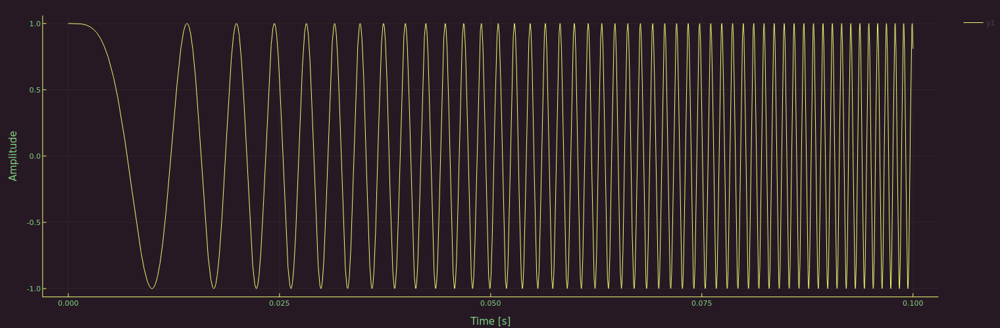

In [5]:
chirp_samples = map(t -> chirp(C, fc, n, period, t, α, 0), ts);
plot(ts, chirp_samples, size=(1200, 500), xlabel="Time [s]", ylabel="Amplitude")

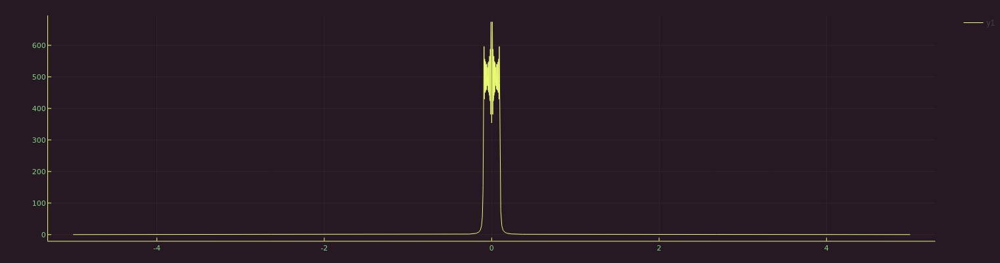

In [8]:
chirp_fft = fft(chirp_samples) |> fftshift
freq = fftfreq(length(ts), 1.0 / period) |> fftshift
plot(freq, abs.(chirp_fft))

### FMCW Plot

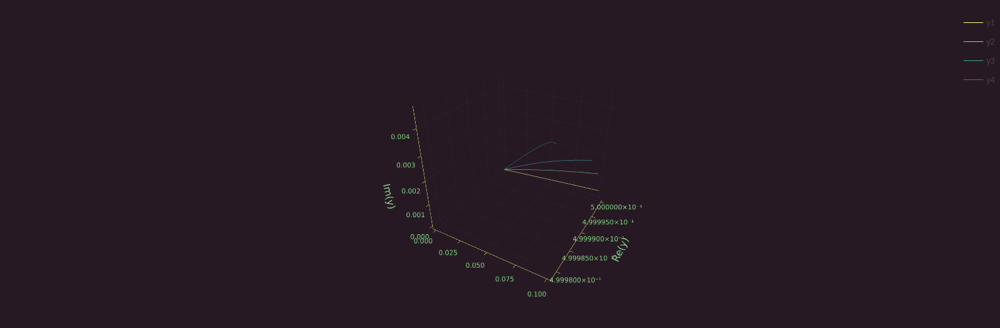

In [10]:
fmcw0_samples = map(t -> fmcw(α, R, fc, v, n, period, t, C), ts)
fmcw1_samples = map(t -> fmcw(α, R+50, fc, v, n, period, t, C), ts)
fmcw2_samples = map(t -> fmcw(α, R+100, fc, v, n, period, t, C), ts)
fmcw3_samples = map(t -> fmcw(α, R+200, fc, v, n, period, t, C), ts)
plot(ts, fmcw0_samples, size=(1200, 500))
plot!(ts, fmcw1_samples)
plot!(ts, fmcw2_samples)
plot!(ts, fmcw3_samples)

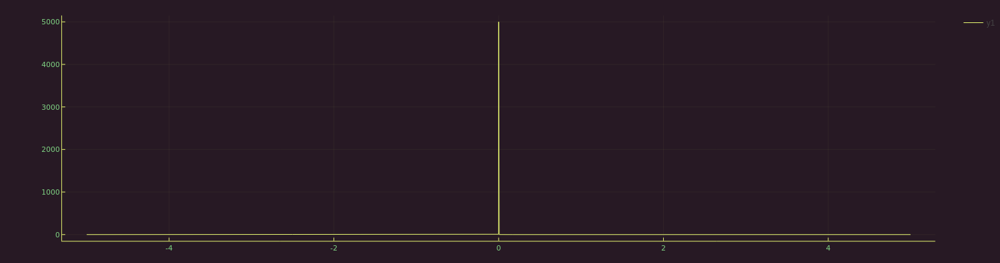

In [13]:
fmcw3_fft = fft(fmcw3_samples) |> fftshift
freq = fftfreq(length(ts), 1.0 / period) |> fftshift
plot(freq, abs.(fmcw3_fft))